# Auto-Encoder using CNN's and MLP's


## Part 0: Initialization
### Step zero: Import Libraries

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
from torchvision import datasets, transforms
import matplotlib.pyplot as plt
import numpy as np
from torchsummary import summary
import time

### Step one: Using a PyTorch Dataset
Loading CIFAR-10 dataset from `torchvision.datasets`. Keeping batch_size >= 16.

In [ ]:
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])


trainset = datasets.CIFAR10(root='./data', train=True, download=True,transform = transform)


trainloader = torch.utils.data.DataLoader(trainset, batch_size=64
                                                    , shuffle=False)

testset = datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)
# testloader_minibatch = torch.utils.data.DataLoader(testset, batch_size=64
                                                    # , shuffle=True, num_workers=2)
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(type(testset))
print(testset.data.shape)
print(testset.targets)

  0%|          | 0/170498071 [00:00<?, ?it/s]

Extracting ./data/cifar-10-python.tar.gz to ./data
Files already downloaded and verified
<class 'torchvision.datasets.cifar.CIFAR10'>
(10000, 32, 32, 3)
[3, 8, 8, 0, 6, 6, 1, 6, 3, 1, 0, 9, 5, 7, 9, 8, 5, 7, 8, 6, 7, 0, 4, 9, 5, 2, 4, 0, 9, 6, 6, 5, 4, 5, 9, 2, 4, 1, 9, 5, 4, 6, 5, 6, 0, 9, 3, 9, 7, 6, 9, 8, 0, 3, 8, 8, 7, 7, 4, 6, 7, 3, 6, 3, 6, 2, 1, 2, 3, 7, 2, 6, 8, 8, 0, 2, 9, 3, 3, 8, 8, 1, 1, 7, 2, 5, 2, 7, 8, 9, 0, 3, 8, 6, 4, 6, 6, 0, 0, 7, 4, 5, 6, 3, 1, 1, 3, 6, 8, 7, 4, 0, 6, 2, 1, 3, 0, 4, 2, 7, 8, 3, 1, 2, 8, 0, 8, 3, 5, 2, 4, 1, 8, 9, 1, 2, 9, 7, 2, 9, 6, 5, 6, 3, 8, 7, 6, 2, 5, 2, 8, 9, 6, 0, 0, 5, 2, 9, 5, 4, 2, 1, 6, 6, 8, 4, 8, 4, 5, 0, 9, 9, 9, 8, 9, 9, 3, 7, 5, 0, 0, 5, 2, 2, 3, 8, 6, 3, 4, 0, 5, 8, 0, 1, 7, 2, 8, 8, 7, 8, 5, 1, 8, 7, 1, 3, 0, 5, 7, 9, 7, 4, 5, 9, 8, 0, 7, 9, 8, 2, 7, 6, 9, 4, 3, 9, 6, 4, 7, 6, 5, 1, 5, 8, 8, 0, 4, 0, 5, 5, 1, 1, 8, 9, 0, 3, 1, 9, 2, 2, 5, 3, 9, 9, 4, 0, 3, 0, 0, 9, 8, 1, 5, 7, 0, 8, 2, 4, 7, 0, 2, 3, 6, 3, 8, 5, 0, 3, 4, 3, 9, 0, 

In [ ]:
dataiter = iter(trainloader)

images, labels = next(dataiter)
print(torch.min(images), torch.max(images))

tensor(-1.) tensor(1.)


torch.Size([64, 3, 32, 32])
torch.Size([64])


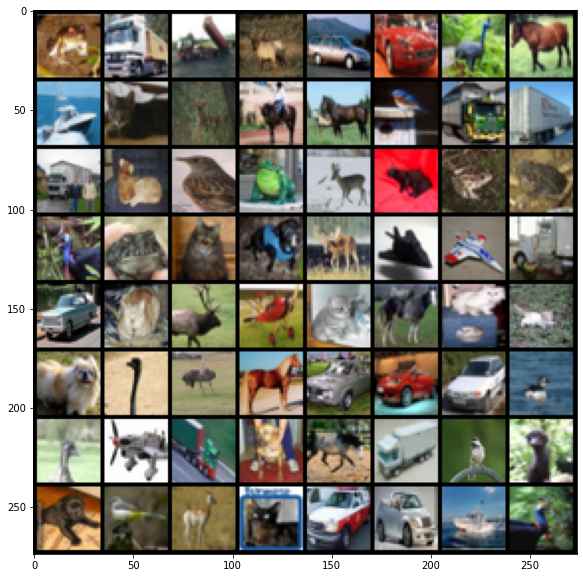

In [ ]:
# let's have a look at the dataset
def imshow(img):
    npimg = img.cpu().numpy()
    plt.figure(figsize=(10,10))
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()


# get some random training images
dataiter = iter(trainloader)
images, labels = next(dataiter)
images = images * 0.5 + 0.5
print(images.shape)
print(labels.shape)

# show images
imshow(torchvision.utils.make_grid(images))

# Auto-Encoder

### Step one: Define 3 Models for Auto-Encoder
1. MLP-only model
2. CNN-MLP combination model
3. CNN-only model

In all the models, encoder and decoder should be consisting of $3$ layers each, and the encoder should be giving a flattened representation of size $32$.

Each layer of encoder decreases or kept equal the output size as compared to input size. Similarly, each layer of decoder should increases or kept equal the output size as compared to input size. 

In [ ]:
class MLPAutoEncoder(nn.Module):
    def __init__(self):
        super().__init__()        
        self.encoder = nn.Sequential(
            nn.Linear(32 * 32 * 3, 512), 
            nn.ReLU(),
            nn.Linear(512, 256),
            nn.ReLU(),
            nn.Linear(256, 64),
            nn.ReLU(),
            nn.Linear(64, 32)
        )
        
        self.decoder = nn.Sequential(
            nn.Linear(32, 64),
            nn.ReLU(),
            nn.Linear(64, 256),
            nn.ReLU(),
            nn.Linear(256, 512),
            nn.ReLU(),
            nn.Linear(512, 32*32*3),
            nn.Tanh()
        )

    def forward(self, x):
        x = x.view(-1, 32 * 32 * 3)
        x = self.encoder(x)
        x = self.decoder(x)
        x = x.view(-1, 3, 32, 32)
        return x


class CNNAutoEncoder(nn.Module):

    def __init__(self):

        super(CNNAutoEncoder,self).__init__() 

        self.eL1 = nn.Conv2d(3, 16, kernel_size=3, padding=1)
        self.eL2 = nn.Conv2d(16, 8, kernel_size=3, padding=1) 
        self.eL3 = nn.Conv2d(8, 2, kernel_size=3, padding=1)

        self.activation = nn.ReLU()

        self.maxPool = nn.MaxPool2d(kernel_size=2, stride=2,return_indices = True) 

        self.dL1 = nn.ConvTranspose2d(2, 8, kernel_size=3, padding=1)
        self.dL2 = nn.ConvTranspose2d(8, 16, kernel_size=3, padding=1)
        self.dL3 =nn.ConvTranspose2d(16, 3, kernel_size=3, padding=1)
            
        self.maxUnpool = nn.MaxUnpool2d(kernel_size=2, stride=2)
        self.tan = nn.Tanh()


    def forward(self, x):
        x = self.activation(self.eL1(x))
        x,i1 = self.maxPool(x)

        x = self.activation(self.eL2(x))
        x,i2 = self.maxPool(x)

        x = self.activation(self.eL3(x))

        x,i3 = self.maxPool(x)
        x = self.maxUnpool(x,i3)

        x = self.activation(self.dL1(x))
        x = self.maxUnpool(x,i2)

        x = self.activation(self.dL2(x))
        x = self.maxUnpool(x,i1)

        x = self.dL3(x)
        x = self.tan(x)

        return x

class ComboAutoEncoder(nn.Module):

    def __init__(self):

        super(ComboAutoEncoder,self).__init__() 

        self.eL1 = nn.Conv2d(3, 16, kernel_size=3, padding=1)
        self.eL2 = nn.Conv2d(16, 8, kernel_size=3, padding=1) 
        self.eL3 = nn.Linear(512,32)

        self.activation = nn.ReLU()

        self.maxPool = nn.MaxPool2d(kernel_size=2, stride=2,return_indices = True) 

        self.dL1 = nn.Linear(32,512)
        self.dL2 = nn.ConvTranspose2d(8, 16, kernel_size=3, padding=1)
        self.dL3 =nn.ConvTranspose2d(16, 3, kernel_size=3, padding=1)
            
        self.maxUnpool = nn.MaxUnpool2d(kernel_size=2, stride=2)
        self.tan = nn.Tanh()

        self.flatten = nn.Flatten()
        self.unflatten = nn.Unflatten(1,(8,8,8))


    def forward(self, x):
        x = self.activation(self.eL1(x))
        x,i1 = self.maxPool(x)

        x = self.activation(self.eL2(x))
        x,i2 = self.maxPool(x) #8*8*8 = 512 --> 32

        x = self.flatten(x)
        x = self.activation(self.eL3(x))
       

      
        x = self.activation(self.dL1(x))
        x = self.unflatten(x)

        x = self.maxUnpool(x,i2)

        x = self.activation(self.dL2(x))
        x = self.maxUnpool(x,i1)

        x = self.dL3(x)
        x = self.tan(x)

        return x
  

In [ ]:

def trainAndReconstruct(model,num_epochs):
    model.to(device)
    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(model.parameters(),lr = 0.001)

    outputs = []
    times = []
    mse = []
    for epoch in range(num_epochs):
        start_time = time.time()
        losses = 0
        for (img, _) in trainloader:
            img = img.to(device)
            recon = model(img)
            loss = criterion(recon, img)
            losses += loss.item()
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

        end_time = time.time()
        time_taken = end_time - start_time
        times.append(time_taken)
        loss_avg = losses / len(trainloader)
        mse.append(loss_avg)
        # print("Loss after ",epoch+1, " is ",loss_avg)
        outputs.append((epoch, img, recon))
      
    dataiter = iter(trainloader)
    images, _ = next(dataiter)

    outputs = model(images.to(device))

    images = images * 0.5 + 0.5
    imshow(torchvision.utils.make_grid(images))

    print("Reconstructed image") 
    print()

    outputs = outputs * 0.5 + 0.5
    imshow(torchvision.utils.make_grid(outputs.data))

    return times,mse

In [ ]:
def plotTimesLosses(times,mse,epochs):
  x = [i for i in range(1, epochs+1)]
  plt.plot(x,times);
  plt.xlabel("Epochs")
  plt.ylabel("Time taken")
  plt.show()

  plt.plot(x,mse);
  plt.xlabel("Epochs")
  plt.ylabel("MSE Loss")
  plt.show()

### Step two: Using MSELoss, train all the models and analyse results
Make sure you also discuss size, time-taken and any other differences you found. Plot MSELoss for each epoch for all models. Also, tabulate the final MSELosses of all models and plot it vis-a-vis:

1. Model Size
2. Model Parameters
3. Time Taken per epoch 

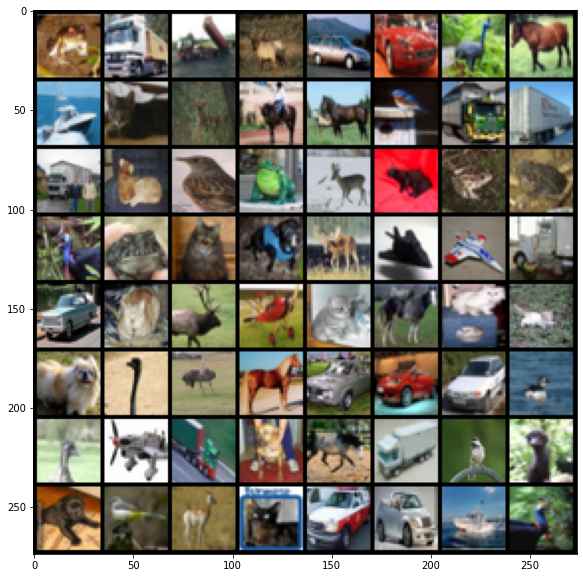

Reconstructed image



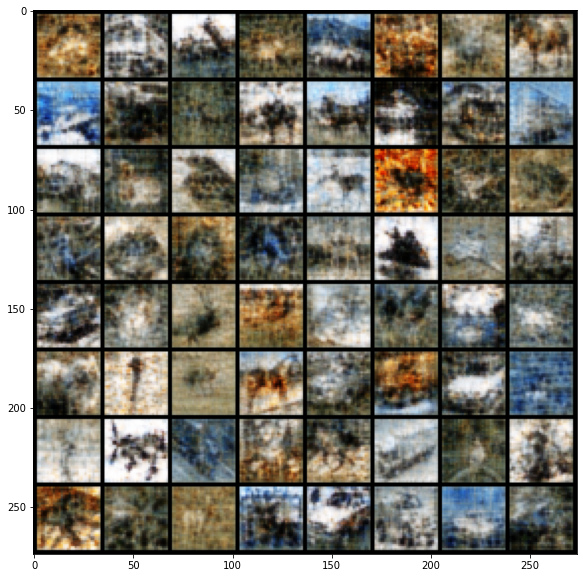

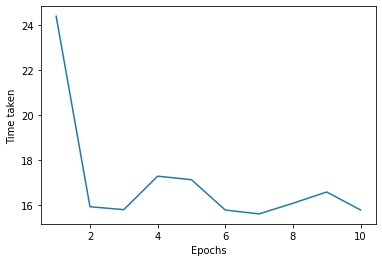

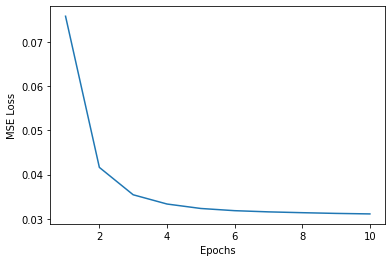

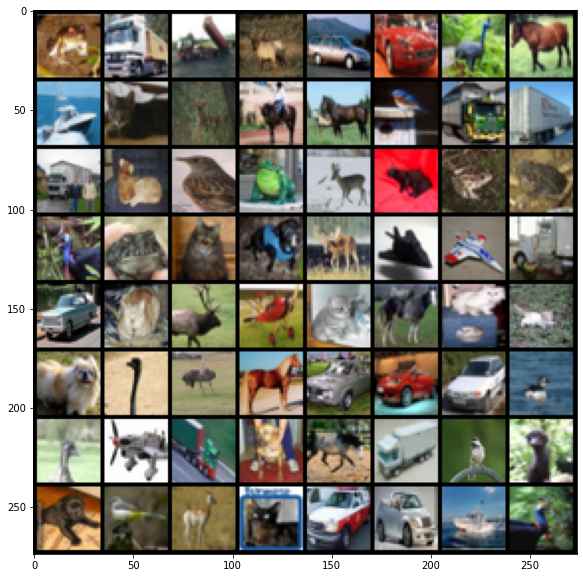

Reconstructed image



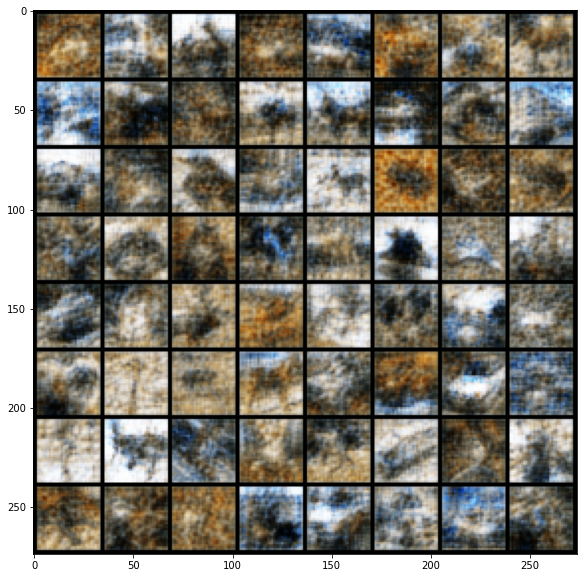

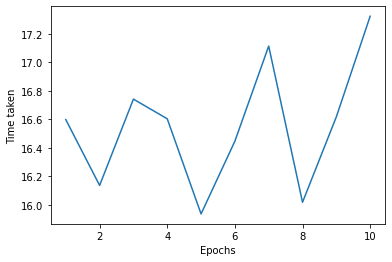

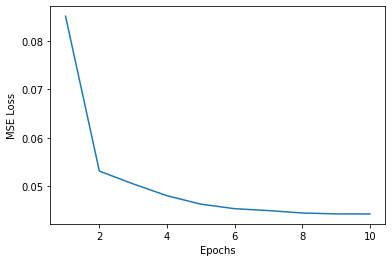

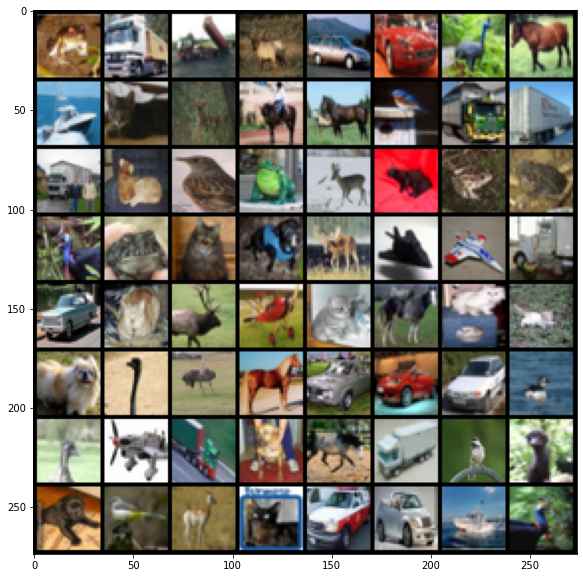

Reconstructed image



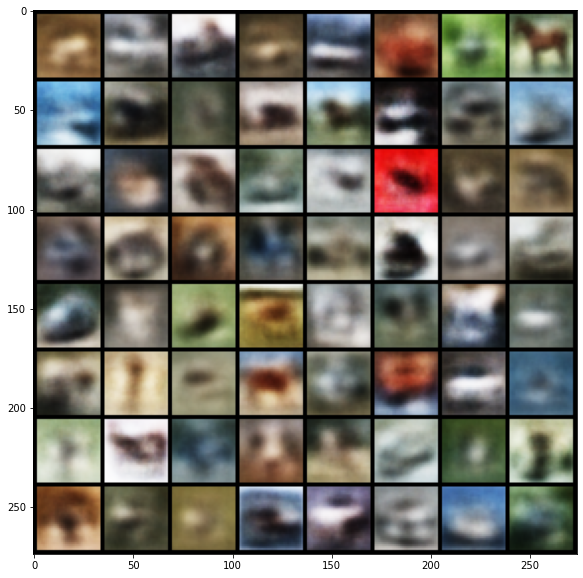

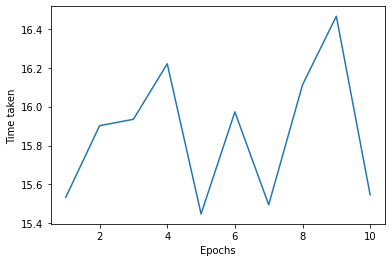

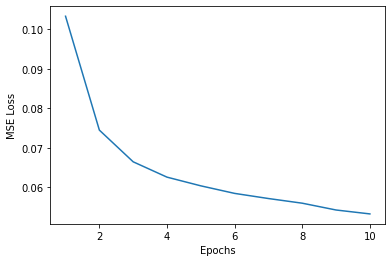

In [ ]:

model1 = ComboAutoEncoder()
model2 = CNNAutoEncoder()
model3 = MLPAutoEncoder()


times,mse = trainAndReconstruct(model1,10)
plotTimesLosses(times,mse,10)

times,mse = trainAndReconstruct(model2,10)
plotTimesLosses(times,mse,10)

times,mse = trainAndReconstruct(model3,10)
plotTimesLosses(times,mse,10)

In [ ]:
summary(model1, (3, 32,32))
summary(model2, (3, 32,32))
summary(model3, (3, 32,32))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 16, 32, 32]             448
              ReLU-2           [-1, 16, 32, 32]               0
         MaxPool2d-3  [[-1, 16, 16, 16], [-1, 16, 16, 16]]               0
            Conv2d-4            [-1, 8, 16, 16]           1,160
              ReLU-5            [-1, 8, 16, 16]               0
         MaxPool2d-6  [[-1, 8, 8, 8], [-1, 8, 8, 8]]               0
           Flatten-7                  [-1, 512]               0
            Linear-8                   [-1, 32]          16,416
              ReLU-9                   [-1, 32]               0
           Linear-10                  [-1, 512]          16,896
             ReLU-11                  [-1, 512]               0
        Unflatten-12              [-1, 8, 8, 8]               0
      MaxUnpool2d-13            [-1, 8, 16, 16]               0
  ConvTranspose2d-14   

### Step three: Let's play with Representation Sizes

Have you ever wondered how varying the size of a CNN auto-encoder's representation can affect its performance

Play with the following representation sizes:
1. 10
2. 32
3. 100
4. 1000

When working with different representation sizes in a CNN auto-encoder, we may reach a point of diminishing returns where increasing the representation size does not lead to significant improvements in reconstruction quality. This can be due to factors such as increased model complexity and longer training times. Discuss where you feel we might reach this point of diminishing returns when working with CIFAR-10 dataset and varying representation sizes.


In [ ]:
class CNNAutoEncoder10(nn.Module):

    def __init__(self):

        super(CNNAutoEncoder10,self).__init__() 

        self.eL1 = nn.Conv2d(3, 16, kernel_size=9, padding=1)
        self.eL2 = nn.Conv2d(16, 8, kernel_size=5, padding=1) 
        self.eL3 = nn.Conv2d(8, 1, kernel_size=(5,11), padding=1)

        self.activation = nn.ReLU()

        self.maxPool = nn.MaxPool2d(kernel_size=2, stride=2,return_indices = True) 

        self.dL1 = nn.ConvTranspose2d(1, 8, kernel_size=(5,11), padding=1)
        self.dL2 = nn.ConvTranspose2d(8, 16, kernel_size=5, padding=1)
        self.dL3 =nn.ConvTranspose2d(16, 3, kernel_size=9, padding=1)
            
        self.maxUnpool = nn.MaxUnpool2d(kernel_size=2, stride=2)
        self.tan = nn.Tanh()


    def forward(self, x):
        x = self.activation(self.eL1(x))
        # x,i1 = self.maxPool(x)

        x = self.activation(self.eL2(x))
        x,i2 = self.maxPool(x)

        x = self.activation(self.eL3(x))

        x,i3 = self.maxPool(x)
        x = self.maxUnpool(x,i3)

        x = self.activation(self.dL1(x))
        x = self.maxUnpool(x,i2)

        x = self.activation(self.dL2(x))
        # x = self.maxUnpool(x,i1)

        x = self.dL3(x)
        x = self.tan(x)

        return x


In [ ]:
class CNNAutoEncoder100(nn.Module):

    def __init__(self):

        super(CNNAutoEncoder100,self).__init__() 

        self.eL1 = nn.Conv2d(3, 16, kernel_size=9, padding=1)
        self.eL2 = nn.Conv2d(16, 8, kernel_size=5, padding=1) 
        self.eL3 = nn.Conv2d(8, 4, kernel_size=5, padding=1)

        self.activation = nn.ReLU()

        self.maxPool = nn.MaxPool2d(kernel_size=2, stride=2,return_indices = True) 

        self.dL1 = nn.ConvTranspose2d(4, 8, kernel_size=5, padding=1)
        self.dL2 = nn.ConvTranspose2d(8, 16, kernel_size=5, padding=1)
        self.dL3 =nn.ConvTranspose2d(16, 3, kernel_size=9, padding=1)
            
        self.maxUnpool = nn.MaxUnpool2d(kernel_size=2, stride=2)
        self.tan = nn.Tanh()


    def forward(self, x):
        x = self.activation(self.eL1(x))
        # x,i1 = self.maxPool(x)

        x = self.activation(self.eL2(x))
        x,i2 = self.maxPool(x)

        x = self.activation(self.eL3(x))

        x,i3 = self.maxPool(x)
        x = self.maxUnpool(x,i3)

        x = self.activation(self.dL1(x))
        x = self.maxUnpool(x,i2)

        x = self.activation(self.dL2(x))
        # x = self.maxUnpool(x,i1)

        x = self.dL3(x)
        x = self.tan(x)

        return x


In [ ]:
class CNNAutoEncoder1000(nn.Module):

    def __init__(self):

        super(CNNAutoEncoder1000,self).__init__() 

        self.eL1 = nn.Conv2d(3,  16, kernel_size=5, padding=1)
        self.eL2 = nn.Conv2d(16, 32, kernel_size=2, padding=1) 
        self.eL3 = nn.Conv2d(32, 40, kernel_size=1, padding=1)

        self.activation = nn.ReLU()

        self.maxPool = nn.MaxPool2d(kernel_size=2, stride=2,return_indices = True) 

        self.dL1 = nn.ConvTranspose2d(40, 32, kernel_size=1, padding=1)
        self.dL2 = nn.ConvTranspose2d(32, 16, kernel_size=2, padding=1)
        self.dL3 =nn.ConvTranspose2d(16, 3, kernel_size=5, padding=1)
            
        self.maxUnpool = nn.MaxUnpool2d(kernel_size=2, stride=2)
        self.tan = nn.Tanh()


    def forward(self, x):
        x = self.activation(self.eL1(x))
        x,i1 = self.maxPool(x)

        x = self.activation(self.eL2(x))
        x,i2 = self.maxPool(x)

        x = self.activation(self.eL3(x))

        x,i3 = self.maxPool(x)
        x = self.maxUnpool(x,i3)

        x = self.activation(self.dL1(x))
        x = self.maxUnpool(x,i2)

        x = self.activation(self.dL2(x))
        x = self.maxUnpool(x,i1)

        x = self.dL3(x)
        x = self.tan(x)

        return x


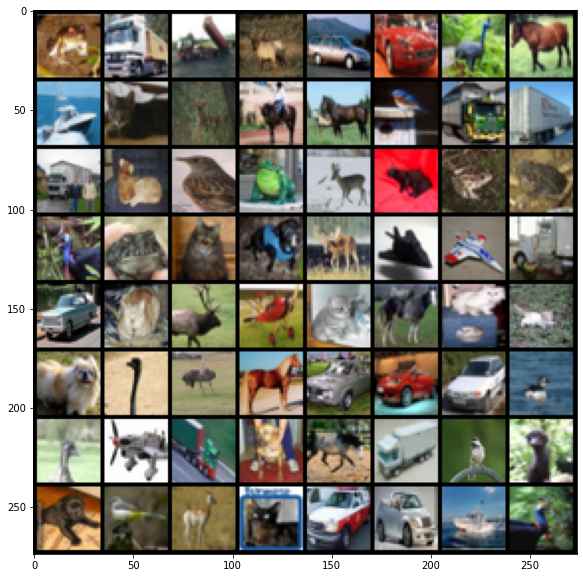

Reconstructed image



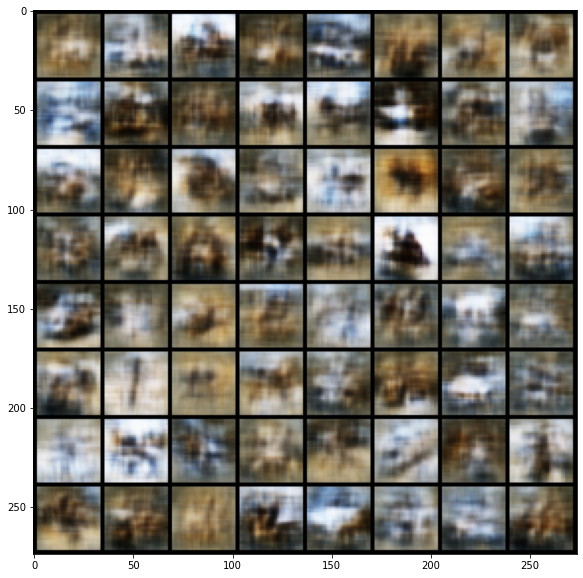

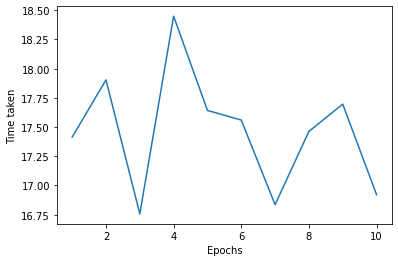

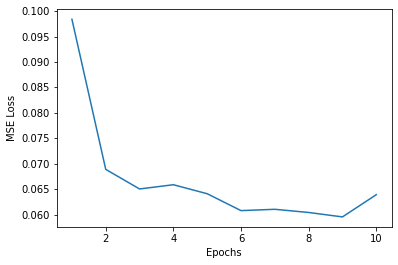

In [ ]:
model10 = CNNAutoEncoder10()
times,mse = trainAndReconstruct(model10,10)
plotTimesLosses(times,mse,10)

In [ ]:
summary(model10,(3,32,32))


----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1           [-1, 16, 26, 26]           3,904
              ReLU-2           [-1, 16, 26, 26]               0
            Conv2d-3            [-1, 8, 24, 24]           3,208
              ReLU-4            [-1, 8, 24, 24]               0
         MaxPool2d-5  [[-1, 8, 12, 12], [-1, 8, 12, 12]]               0
            Conv2d-6             [-1, 1, 10, 4]             441
              ReLU-7             [-1, 1, 10, 4]               0
         MaxPool2d-8  [[-1, 1, 5, 2], [-1, 1, 5, 2]]               0
       MaxUnpool2d-9             [-1, 1, 10, 4]               0
  ConvTranspose2d-10            [-1, 8, 12, 12]             448
             ReLU-11            [-1, 8, 12, 12]               0
      MaxUnpool2d-12            [-1, 8, 24, 24]               0
  ConvTranspose2d-13           [-1, 16, 26, 26]           3,216
             ReLU-14     

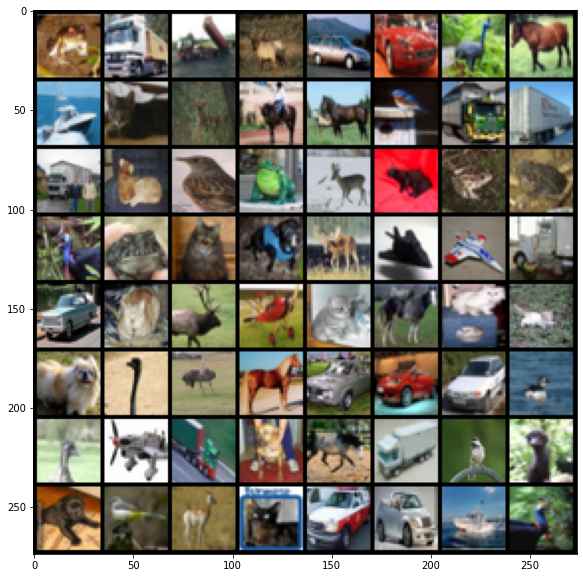

Reconstructed image



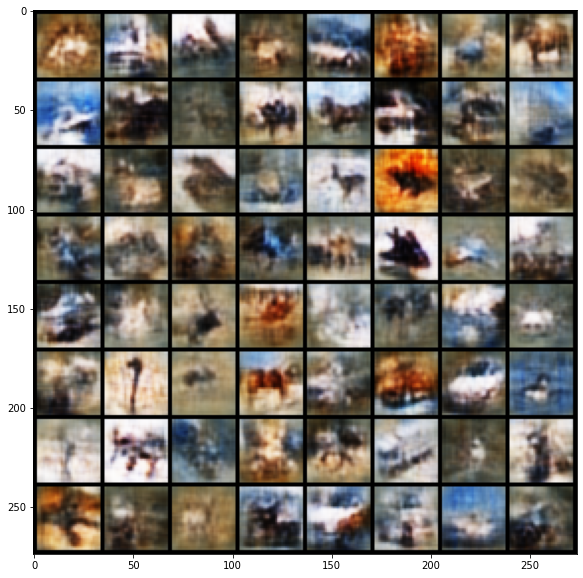

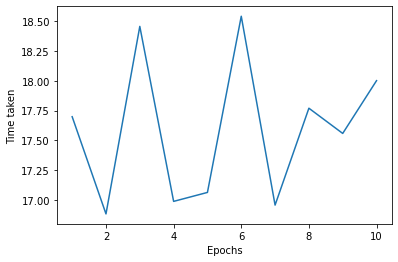

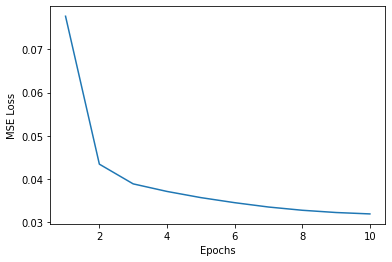

In [ ]:
model100 = CNNAutoEncoder100()
times,mse = trainAndReconstruct(model100,10)
plotTimesLosses(times,mse,10)

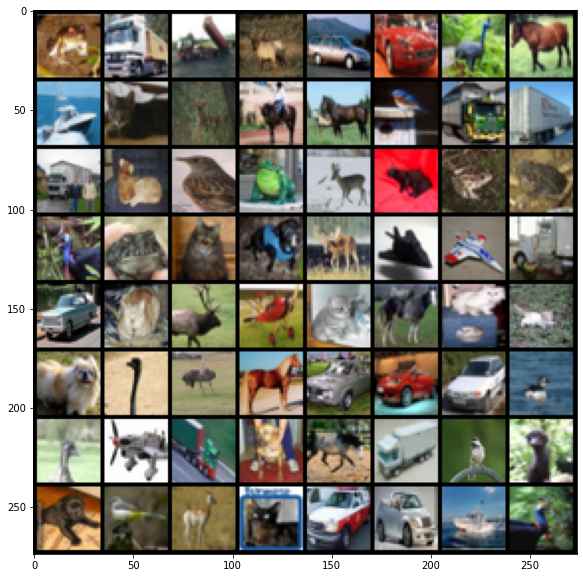

Reconstructed image



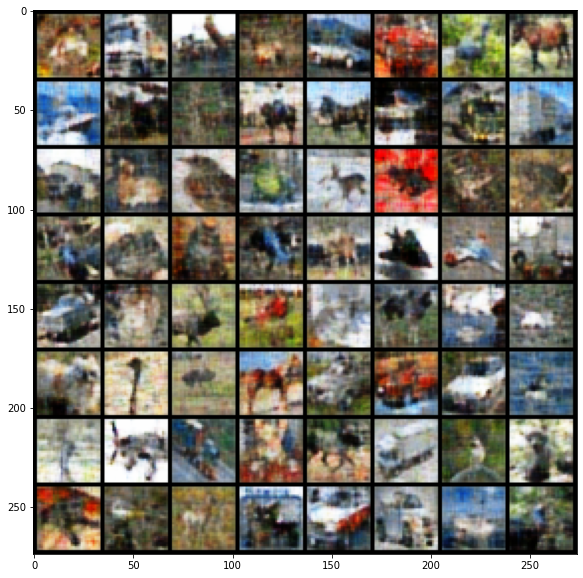

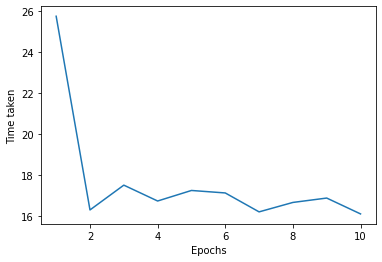

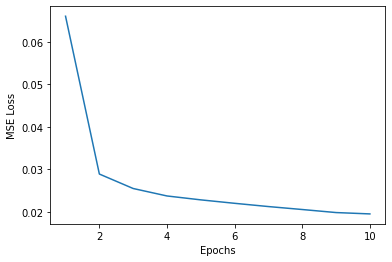

In [ ]:
model1000 = CNNAutoEncoder1000()
times,mse = trainAndReconstruct(model1000,10)
plotTimesLosses(times,mse,10)

### Step four: What about the number of layers?

Experimenting with different numbers of layers in the encoder and decoder of a CNN auto-encoder can have a significant impact on its performance with CIFAR-10 dataset. For our next challenge, let's explore how the number of layers can affect the quality of the reconstructed images. Would a deeper or shallower network be more effective for this task?

# Play with the following numbers of layers for encoder and decoder each:
1. 1
2. 3
3. 5
4. 10

When experimenting with different numbers of layers in the encoder and decoder of a CNN auto-encoder, we may reach a point of diminishing returns where adding more layers does not result in significant improvements in reconstruction quality. Additionally, deeper networks may be prone to overfitting, especially when training data is limited. 

In [ ]:
class CNNAutoEncoderL1(nn.Module):

    def __init__(self):

        super(CNNAutoEncoderL1,self).__init__() 

        self.eL1 = nn.Conv2d(3, 3, kernel_size=3, padding=1)
       
        self.activation = nn.ReLU()

        self.maxPool = nn.MaxPool2d(kernel_size=2, stride=2,return_indices = True) 

        self.dL1 = nn.ConvTranspose2d(3, 3, kernel_size=3, padding=1)
        
        self.maxUnpool = nn.MaxUnpool2d(kernel_size=2, stride=2)

        self.tan = nn.Tanh()


    def forward(self, x):
        x = self.activation(self.eL1(x))
        x,i11 = self.maxPool(x)
        x,i12 = self.maxPool(x)

        x = self.maxUnpool(x,i12)
        x = self.maxUnpool(x,i11)
        x = self.dL1(x)
        x = self.tan(x)

        return x


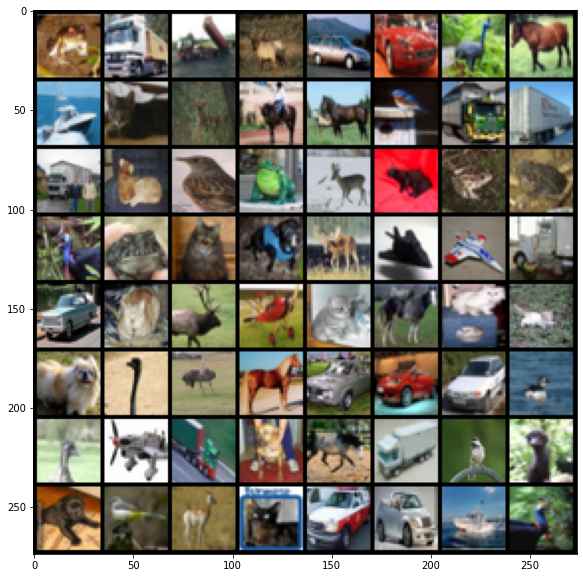

Reconstructed image



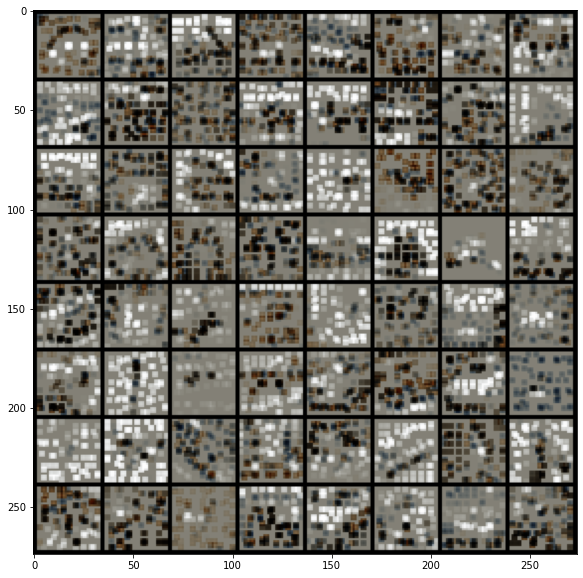

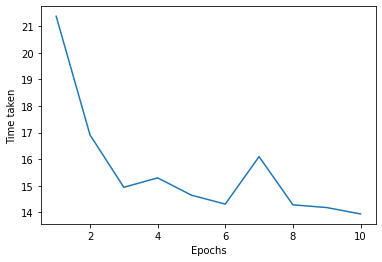

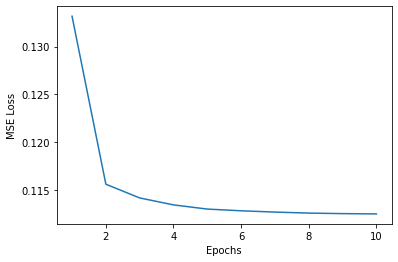

In [ ]:
modelL1 = CNNAutoEncoderL1()
times,mse = trainAndReconstruct(modelL1,10)
plotTimesLosses(times,mse,10)

In [ ]:
class CNNAutoEncoderL3(nn.Module):

    def __init__(self):

        super(CNNAutoEncoderL3,self).__init__() 

        self.eL1 = nn.Conv2d(3, 16, kernel_size=3, padding=1)
        self.eL2 = nn.Conv2d(16, 8, kernel_size=3, padding=1) 
        self.eL3 = nn.Conv2d(8, 3, kernel_size=3, padding=1)

        self.activation = nn.ReLU()

        self.maxPool = nn.MaxPool2d(kernel_size=2, stride=2,return_indices = True) 

        self.dL1 = nn.ConvTranspose2d(3, 8, kernel_size=3, padding=1)
        self.dL2 = nn.ConvTranspose2d(8, 16, kernel_size=3, padding=1)
        self.dL3 =nn.ConvTranspose2d(16, 3, kernel_size=3, padding=1)
            
        self.maxUnpool = nn.MaxUnpool2d(kernel_size=2, stride=2)
        self.tan = nn.Tanh()


    def forward(self, x):
        x = self.activation(self.eL1(x))
        x,i1 = self.maxPool(x)

        x = self.activation(self.eL2(x))
        x,i2 = self.maxPool(x)

        x = self.activation(self.eL3(x))

        # x,i3 = self.maxPool(x)
        # x = self.maxUnpool(x,i3)

        x = self.activation(self.dL1(x))
        x = self.maxUnpool(x,i2)

        x = self.activation(self.dL2(x))
        x = self.maxUnpool(x,i1)

        x = self.dL3(x)
        x = self.tan(x)

        return x


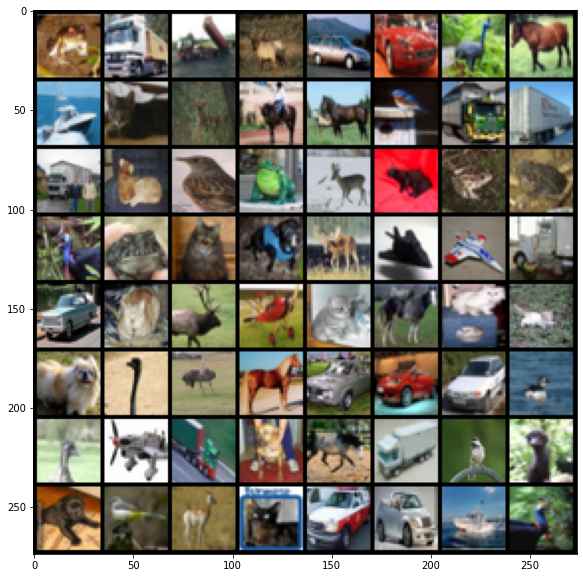

Reconstructed image



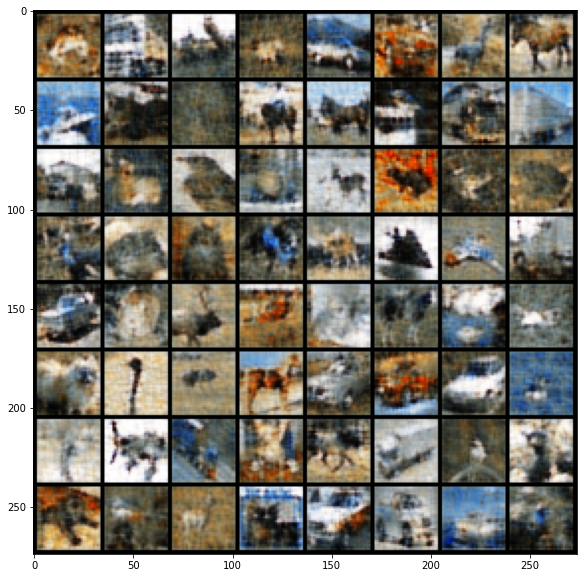

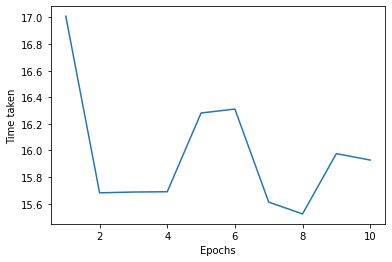

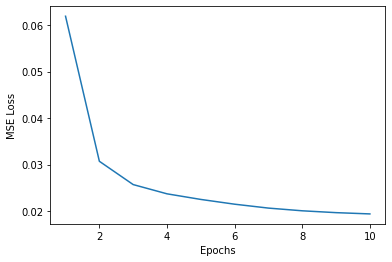

In [ ]:
modelL3 = CNNAutoEncoderL3()
times,mse = trainAndReconstruct(modelL3,10)
plotTimesLosses(times,mse,10)

In [ ]:
class CNNAutoEncoderL5(nn.Module):

    def __init__(self):

        super(CNNAutoEncoderL5,self).__init__() 

        self.eL1 = nn.Conv2d(3, 14, kernel_size=3, padding=1)
        self.eL2 = nn.Conv2d(14, 28, kernel_size=3, padding=1) 
        self.eL3 = nn.Conv2d(28, 18, kernel_size=3, padding=1)
        self.eL4 = nn.Conv2d(18, 8, kernel_size=3, padding=1)
        self.eL5 = nn.Conv2d(8, 3, kernel_size=3, padding=1)

        self.activation = nn.ReLU()

        self.maxPool = nn.MaxPool2d(kernel_size=2, stride=2,return_indices = True) 

        self.dL1 = nn.ConvTranspose2d(3, 8, kernel_size=3, padding=1)
        self.dL2 = nn.ConvTranspose2d(8, 18, kernel_size=3, padding=1)
        self.dL3 =nn.ConvTranspose2d(18, 28, kernel_size=3, padding=1)
        self.dL4 =nn.ConvTranspose2d(28, 14, kernel_size=3, padding=1)
        self.dL5 =nn.ConvTranspose2d(14, 3, kernel_size=3, padding=1)
            
            
            
        self.maxUnpool = nn.MaxUnpool2d(kernel_size=2, stride=2)
        self.tan = nn.Tanh()


    def forward(self, x):
        x = self.activation(self.eL1(x))
        x,i1 = self.maxPool(x)

        x = self.activation(self.eL2(x))
        x = self.activation(self.eL3(x))

        x = self.activation(self.eL4(x))
        x,i4 = self.maxPool(x)
        
        x = self.activation(self.eL5(x))


        x = self.activation(self.dL1(x))
        x = self.maxUnpool(x,i4)

        x = self.activation(self.dL2(x))
        
        
        x = self.activation(self.dL3(x))

        x = self.activation(self.dL4(x))

        x = self.maxUnpool(x,i1)
        x = self.dL5(x)

        
        x = self.tan(x)

        return x


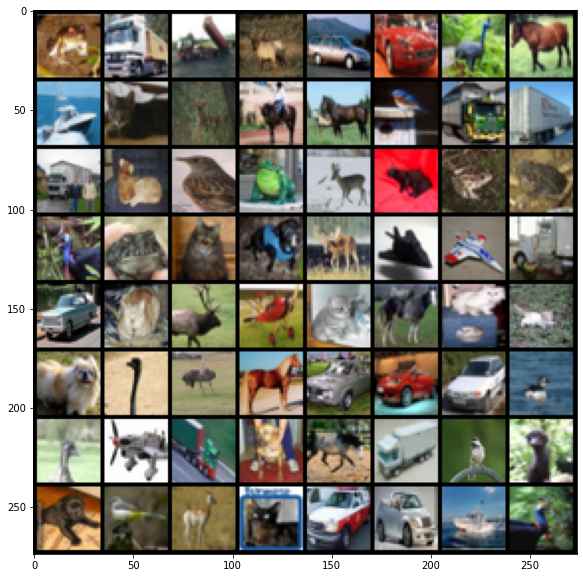

Reconstructed image



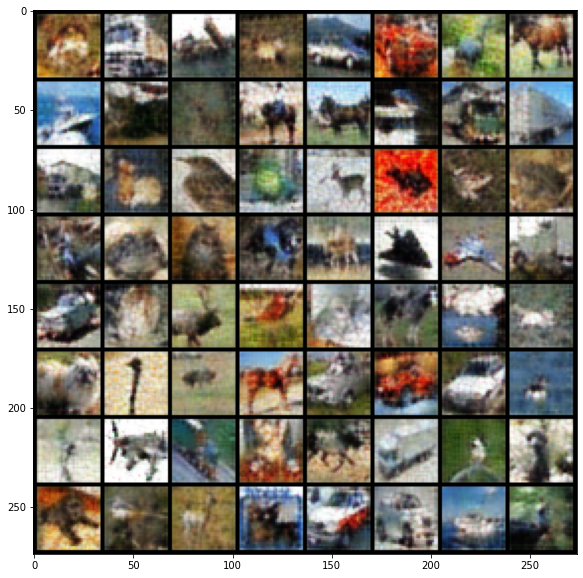

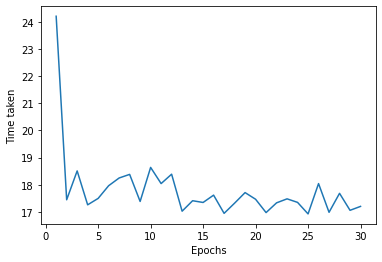

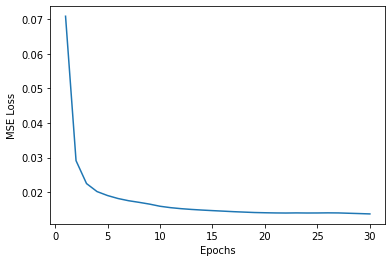

In [ ]:
modelL5 = CNNAutoEncoderL5()
times,mse = trainAndReconstruct(modelL5,30)
plotTimesLosses(times,mse,30)

In [ ]:
class CNNAutoEncoderL10(nn.Module):

    def __init__(self):

        super(CNNAutoEncoderL10,self).__init__() 

        self.eL1 = nn.Conv2d(3, 16, kernel_size=3, padding=1)
        self.eL2 = nn.Conv2d(16, 32, kernel_size=3, padding=1) 
        self.eL3 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.eL4 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.eL5 = nn.Conv2d(128, 256, kernel_size=3, padding=1)
        self.eL6 = nn.Conv2d(256, 128, kernel_size=3, padding=1)
        self.eL7 = nn.Conv2d(128, 64, kernel_size=3, padding=1)
        self.eL8 = nn.Conv2d(64, 32, kernel_size=3, padding=1)
        self.eL9 = nn.Conv2d(32, 16, kernel_size=3, padding=1)
        self.eL10 = nn.Conv2d(16, 3, kernel_size=3, padding=1)

        self.activation = nn.ReLU()

        self.maxPool = nn.MaxPool2d(kernel_size=2, stride=2,return_indices = True) 

        self.dL1 = nn.ConvTranspose2d(3, 16, kernel_size=3, padding=1)
        self.dL2 = nn.ConvTranspose2d(16, 32, kernel_size=3, padding=1)
        self.dL3 =nn.ConvTranspose2d(32, 64, kernel_size=3, padding=1)
        self.dL4 =nn.ConvTranspose2d(64, 128, kernel_size=3, padding=1)
        self.dL5 =nn.ConvTranspose2d(128, 256, kernel_size=3, padding=1)
        self.dL6 =nn.ConvTranspose2d(256, 128, kernel_size=3, padding=1)
        self.dL7 =nn.ConvTranspose2d(128, 64, kernel_size=3, padding=1)
        self.dL8 =nn.ConvTranspose2d(64, 32, kernel_size=3, padding=1)
        self.dL9 =nn.ConvTranspose2d(32, 16, kernel_size=3, padding=1)
        self.dL10 =nn.ConvTranspose2d(16, 3, kernel_size=3, padding=1)
            
        self.maxUnpool = nn.MaxUnpool2d(kernel_size=2, stride=2)
        self.tan = nn.Tanh()


    def forward(self, x):
        x = self.activation(self.eL1(x))
        x = self.activation(self.eL2(x))
        x = self.activation(self.eL3(x))
        x,i2 = self.maxPool(x)
        x = self.activation(self.eL4(x))
        x = self.activation(self.eL5(x))
        x = self.activation(self.eL6(x))
        x,i6 = self.maxPool(x)
        x = self.activation(self.eL7(x))
        x = self.activation(self.eL8(x))
        x = self.activation(self.eL9(x))
        x = self.activation(self.eL10(x))
        # encoded = x

        x = self.activation(self.dL1(x))
        x = self.activation(self.dL2(x))
        x = self.activation(self.dL3(x))
        x = self.activation(self.dL4(x))
        x = self.maxUnpool(x,i6)
        x = self.activation(self.dL5(x))
        x = self.activation(self.dL6(x))
        x = self.activation(self.dL7(x))
        x = self.maxUnpool(x,i2)
        x = self.activation(self.dL8(x))
        x = self.activation(self.dL9(x))
        x = self.dL10(x)
        x = self.tan(x)

        return x

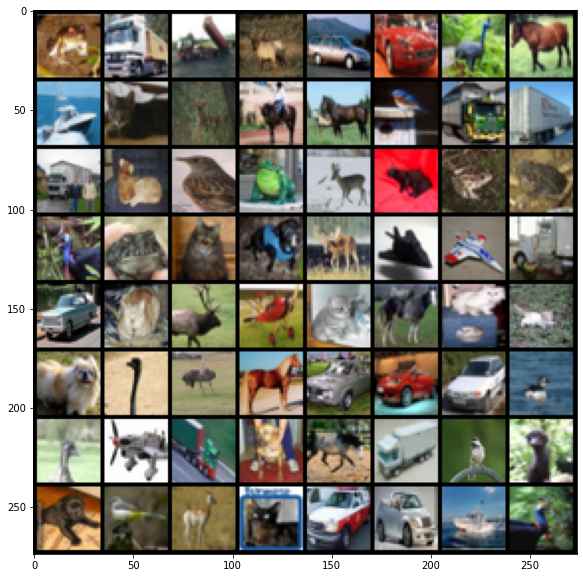

Reconstructed image



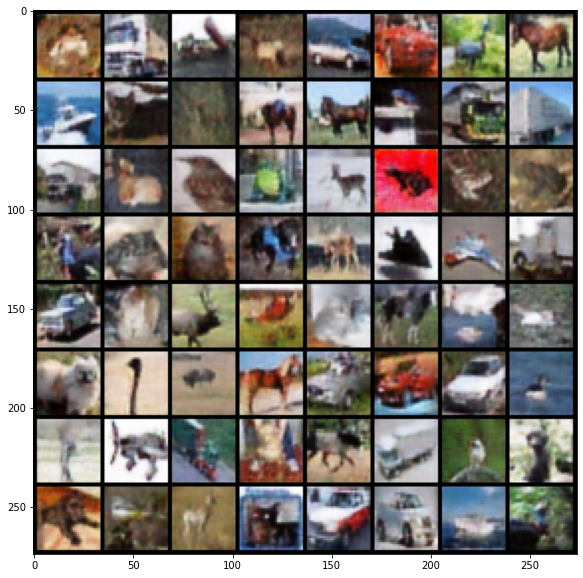

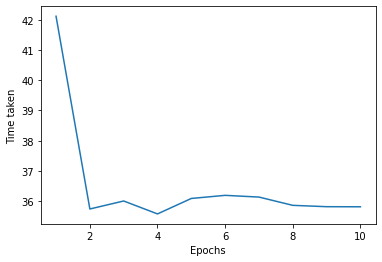

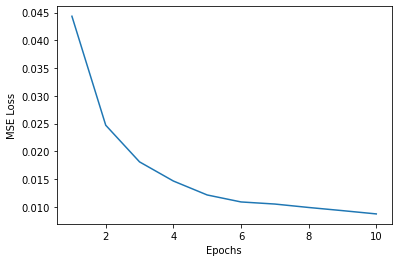

In [ ]:
modelL10 = CNNAutoEncoderL10()
times,mse = trainAndReconstruct(modelL10,10)
plotTimesLosses(times,mse,10)

### Explanation time!

AutoEncoder  is a non-linear neural network algorithm used for data compression and representation. It comprises an encoder and a decoder, which reduce the dimensionality of input data. Unlike linear methods like PCA and t-SNE, AE can learn more complex representations of data through efficient end-to-end training. Variational AutoEncoder (VAE) is another type of AE that introduces a probabilistic framework for generative modeling, allowing for the creation of new data points in the latent space. AE is an effective unsupervised learning method for data compression, representation, and generative modeling.

## Part 2: The Return of KNN -- Applying KNN on encoded image
Autoencoder representations can be useful for a wide range of machine learning tasks beyond just reconstructing input data. For example, the output of an encoder can be used as a feature representation for classification using k-Nearest Neighbors (kNN) or other classifiers. Similarly, the encoded representations can be used for unsupervised tasks like clustering, where the model groups similar images together based on their feature representation. This makes autoencoders a versatile tool for feature learning, with the potential to enhance the performance of a wide range of machine learning algorithms.

Since we have already trained auto-encoder on CIFAR-10, we will employ the encoder from the CNN model with representation size of $10$. Using a subset of CIFAR-10 train and test datasets, each with 10,000 and 1000 samples respectively, with an equal number of samples for each class, implement kNN classification using the encoder output as features. 

In [ ]:
def trainKNN(model,num_epochs,trainloader):
    model.to(device)
    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(model.parameters(),lr = 0.001)

    outputs = []
    for epoch in range(num_epochs):
        losses = 0
        for (img,l) in trainloader:
            
            img = img.to(device)
            # img = img.view(img.size(0),  3, 32, 32)
            
            recon,enc = model(img)
            loss = criterion(recon, img)
            losses += loss.item()
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()


        loss_avg = losses / len(trainloader)
        print("Loss after ",epoch+1, " is ",loss_avg)
        # outputs.append((epoch, img, recon))
    
    return model

In [ ]:
class CNNAutoEncoderKNN(nn.Module):

    def __init__(self):

        super(CNNAutoEncoderKNN,self).__init__() 

        self.eL1 = nn.Conv2d(3, 16, kernel_size=3, padding=1)
        self.eL2 = nn.Conv2d(16, 32, kernel_size=3, padding=1) 
        self.eL3 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.eL4 = nn.Conv2d(64, 32, kernel_size=3, padding=1)
        self.eL5 = nn.Conv2d(32, 16, kernel_size=3, padding=1)

        self.activation = nn.ReLU()

        self.maxPool = nn.MaxPool2d(kernel_size=2, stride=2,return_indices = True) 

        self.dL1 = nn.ConvTranspose2d(16, 32, kernel_size=3, padding=1)
        self.dL2 = nn.ConvTranspose2d(32, 64, kernel_size=3, padding=1)
        self.dL3 =nn.ConvTranspose2d(64, 32, kernel_size=3, padding=1)
        self.dL4 =nn.ConvTranspose2d(32, 16, kernel_size=3, padding=1)
        self.dL5 =nn.ConvTranspose2d(16, 3, kernel_size=3, padding=1)
            
            
            
        self.maxUnpool = nn.MaxUnpool2d(kernel_size=2, stride=2)
        self.tan = nn.Tanh()


    def forward(self, x):
        x = self.activation(self.eL1(x))
        x,i1 = self.maxPool(x)

        x = self.activation(self.eL2(x))
        x,i2 = self.maxPool(x)

        x = self.activation(self.eL3(x))

        x = self.activation(self.eL4(x))
        x,i4 = self.maxPool(x)
        
        x = self.activation(self.eL5(x))

        encoded = x

        x = self.activation(self.dL1(x))
        x = self.maxUnpool(x,i4)

        x = self.activation(self.dL2(x))
        
        
        x = self.activation(self.dL3(x))
        x = self.maxUnpool(x,i2)
        
        x = self.activation(self.dL4(x))

        x = self.maxUnpool(x,i1)
        x = self.dL5(x)

        
        x = self.tan(x)

        return x,encoded


In [ ]:
# code and analysis here. Remember to keep your analysis of high quality at all times.
train_x = trainset.data
train_y = np.array(trainset.targets)

test_x = testset.data
test_y = np.array(testset.targets)
classes = ['plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']
train_indices = []
test_indices = [
idx = []
for c in range(len(classes)):
    # idx1 = np.where(train_y == c)[0][:1000]
    # train_indices.append(idx1)
    # idx2 = np.where(test_y == c)[0][:100]
    # test_indices.append(idx2)
    train_indices += [i for i in range(len(trainset)) if trainset[i][1] == c][:1000]
    test_indices += [i for i in range(len(testset)) if testset[i][1] == c][:100]

    
new_trainset = torch.utils.data.Subset(trainset, train_indices)
new_testset = torch.utils.data.Subset(testset, test_indices)


# Create the dataloaders for training and testing
trainloaderknn = torch.utils.data.DataLoader(new_trainset, batch_size=1, shuffle=True)
testloaderknn = torch.utils.data.DataLoader(new_testset, batch_size=1, shuffle=True)



In [ ]:
new_testset = torch.utils.data.Subset(testset, test_indices)
testloaderknn = torch.utils.data.DataLoader(new_testset, batch_size=1, shuffle=True)

In [ ]:
print(trainloaderknn)
dataiter = iter(trainloaderknn)
images,l = next(dataiter)
print(images.shape)
modelL10 = CNNAutoEncoderKNN()
modelKNN = trainKNN(modelL10,5,trainloaderknn)

torch.Size([1, 3, 32, 32])
Loss after  1  is  0.047919655080512165
Loss after  2  is  0.03156660657662433
Loss after  3  is  0.028060956530552357
Loss after  4  is  0.026679209887469187
Loss after  5  is  0.025327389506762846


In [ ]:
xTrain_encoded = []
y_train = []
for (img,l) in trainloaderknn:
  # print(img)  
  img = img.to(device)
  with torch.no_grad():
    recon,enc = modelKNN(img)
  enc = enc.reshape(enc.shape[0],-1)
  xTrain_encoded.append(enc.cpu().numpy())
  y_train.append(l)
xTrain_encoded = np.concatenate(xTrain_encoded,axis = 0)
y_train = np.concatenate(y_train,axis = 0)
print(len(xTrain_encoded))
print(len(y_train))

10000
10000


In [ ]:
xTest_encoded = []
y_test = []
for (img,l) in testloaderknn:
  # print(img1)  
  img = img.to(device)
  with torch.no_grad():
    recon,enc = modelKNN(img)
  enc = enc.reshape(enc.shape[0],-1)
  xTest_encoded.append(enc.cpu().numpy())
  y_test.append(l)
xTest_encoded = np.concatenate(xTest_encoded,axis = 0)
y_test = np.concatenate(y_test,axis = 0)
print(len(xTest_encoded))
print(len(y_test))

1000
1000


In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import f1_score
k = 5
knn = KNeighborsClassifier(n_neighbors=k)

knn.fit(xTrain_encoded, y_train)

# Test kNN classifier
y_pred = knn.predict(xTest_encoded)
accuracy = accuracy_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred, average='macro')

print(f'Accuracy: {accuracy:.4f}')
print(f'F1 score: {f1:.4f}')

Accuracy: 0.3520
F1 score: 0.3495


## 